# <a id='0'>ESPAÑA y sus FUENTES de ENERGÍA</h1>
![FuentesEnergia](
img_energia.webp)

## *ÍNDICE:* 
---
- [ 1. ANÁLISIS EXPLORATORIO DE DATOS (EDA):](#1)
    - [1.1. Hipótesis](#11)
    - [1.2. Acondicionamiento bases de datos](#12)
    - [1.3. Análisis visual](#13)
        - [1.3.1. Evolución energías en España](#131)
        - [1.3.2. Energía generada vs energía demandada](#132)
        - [1.3.3. Balance eficiencia energética-efectos adversos](#133)
        - [1.3.4. Influencia del clima en la generación de energía](#131)
    - [1.4. Análisis estadístico](#14)
- [2. CONCLUSIONES](#2)
---

### *Contacto:*
___
* Email: ***carla.glezz@gmail.com***
* Linkedin: ***https://www.linkedin.com/in/mariacarlagonzalezgonzalez/***
---

 
# **1. Análisis Exploratio de Datos (EDA)**<a id='1'></a>

##  **1.1. Hipótesis**<a id='11'></a>

### **¿Energía a invertir en España?** 🤔

1. **¿Progresión de las distintas fuentes de energía en España en los últimos años?** 
    * Hipótesis: previsiblemente hay un aumento en renovables
    * ¿Energía o energías que más generan? 


2. **¿Autoabastecimiento?**
    * ¿Coinciden la energía que consume España con la que genera?
        + Excedente podría indicar la exportación y un deficit la importación. 
        + Otra posibilidad es falta de datos en alguno de los resultados. 
        (Se está trabajando en el almacenaje de energía pero de momento no es una tecnología en uso)
    * En función de la demanda/consumo anual de energía en España, ¿cuánto faltaría para autoabastecerse?    


3. **¿Eficiencia vs efectos adversos?** (elegiendo 2 de las energías con mayor probabilidad de ser nuestra elección final)
    * ¿Se puede encontrar un equilibrio? ¿Cómo nos afecta?


4. **¿Influencia del clima?**
    * Es previsible que sea afirmativa la respuesta, sobretodo en renovables.
        + Los datos son una muestra, es necesario verificar que es suficiente y representativa de la población. 
    * ¿Se considera significativa esta influencia? 
        + Es posible que halla otros factores más significativos, como pueden ser la potencia instalada, la tecnología empleada,etc.


5. **Análisis económico** *(Punto a estudiar más adelante)*
    * ¿Cuales son las fuentes más baratas?
    * ¿Cuales son las más rentables?
    * ¿Las que más generan son las más rentables económicamente?
    * ¿Se puede hallar, si no lo hubiera, entre eficiencia energética y rentabilidad económica?


    




##  **1.2. Acondicionamiento bases de datos**<a id='12'></a>

In [132]:
# Librery
from utils.utilsEDA import *

In [133]:
# Read all csv 

# NOTA IMPORTANTE: Copiar path hasta la carpeta scr (único cambio para funcionamiento)
preroot='/Users/mcgg/Documents/TheBridge_DataScience_py_local/02_DATA_ANALISIS/EDA_MC/EDA-energia/energy-data/src'

df_spn=pd.read_csv(preroot+'/data/spn_energy_data.csv')
df_wheather_spn=pd.read_csv(preroot+'/data/spn_weather_features.csv')

### *Extracción inicial info. de los CSVs*

In [134]:
print('* Datos energía España: *')
df_spn.info()

* Datos energía España: *
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 29 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         35064 non-null  object 
 1   generation biomass                           35045 non-null  float64
 2   generation fossil brown coal/lignite         35046 non-null  float64
 3   generation fossil coal-derived gas           35046 non-null  float64
 4   generation fossil gas                        35046 non-null  float64
 5   generation fossil hard coal                  35046 non-null  float64
 6   generation fossil oil                        35045 non-null  float64
 7   generation fossil oil shale                  35046 non-null  float64
 8   generation fossil peat                       35046 non-null  float64
 9   generation geothermal                        3

In [135]:
print('* Datos clima España: *')
df_wheather_spn.info()

* Datos clima España: *
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178396 entries, 0 to 178395
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   dt_iso               178396 non-null  object 
 1   city_name            178396 non-null  object 
 2   temp                 178396 non-null  float64
 3   temp_min             178396 non-null  float64
 4   temp_max             178396 non-null  float64
 5   pressure             178396 non-null  int64  
 6   humidity             178396 non-null  int64  
 7   wind_speed           178396 non-null  int64  
 8   wind_deg             178396 non-null  int64  
 9   rain_1h              178396 non-null  float64
 10  rain_3h              178396 non-null  float64
 11  snow_3h              178396 non-null  float64
 12  clouds_all           178396 non-null  int64  
 13  weather_id           178396 non-null  int64  
 14  weather_main         178396 non-null  object

### *Tratamiento bases de datos:*


#### csv generación energía España

```df_spn```: DataFrame que contiene los datos de energía en españa recogidos desde 1 enero 2015 hasta 31 diciembre 2018

|column	|description	|
|-------|---------------|
|time||
|generation biomass||
|generation fossil brown coal/lignite||
|generation fossil bcoal-derived gas||
|generation fossil gas||
|generation fossil hard coal||
|generation fossil oil||
|generation fossil oil shale||
|generation fossil peat||
|generation geothermal||
|generation hydro pumped storage aggregated||
|generation hydro pumped storage consumption||
|generation hydro run-of-river and poundage||
|generation hydro water reservoir||
|generation marine||
|generation nuclear||
|generation other||
|generation other renewable||
|generation solar||
|generation waste||
|generation wind offshore||
|generation wind onshore||
|forecast solar day ahead||
|forecast wind offshore eday ahead||
|forecast wind onshore day ahead||
|total load forecast||
|total load actual||
|price day ahead||
|price actual||


In [136]:
print('Número de columnas: ',len(df_spn.columns))
df_spn.columns

Número de columnas:  29


Index(['time', 'generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil coal-derived gas', 'generation fossil gas',
       'generation fossil hard coal', 'generation fossil oil',
       'generation fossil oil shale', 'generation fossil peat',
       'generation geothermal', 'generation hydro pumped storage aggregated',
       'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation marine',
       'generation nuclear', 'generation other', 'generation other renewable',
       'generation solar', 'generation waste', 'generation wind offshore',
       'generation wind onshore', 'forecast solar day ahead',
       'forecast wind offshore eday ahead', 'forecast wind onshore day ahead',
       'total load forecast', 'total load actual', 'price day ahead',
       'price actual'],
      dtype='object')

In [137]:
df_spn.tail()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
35059,2018-12-31 19:00:00+01:00,297.0,0.0,0.0,7634.0,2628.0,178.0,0.0,0.0,0.0,...,277.0,0.0,3113.0,96.0,NaN,3253.0,30619.0,30653.0,68.85,77.02
35060,2018-12-31 20:00:00+01:00,296.0,0.0,0.0,7241.0,2566.0,174.0,0.0,0.0,0.0,...,280.0,0.0,3288.0,51.0,NaN,3353.0,29932.0,29735.0,68.40,76.16
35061,2018-12-31 21:00:00+01:00,292.0,0.0,0.0,7025.0,2422.0,168.0,0.0,0.0,0.0,...,286.0,0.0,3503.0,36.0,NaN,3404.0,27903.0,28071.0,66.88,74.30
35062,2018-12-31 22:00:00+01:00,293.0,0.0,0.0,6562.0,2293.0,163.0,0.0,0.0,0.0,...,287.0,0.0,3586.0,29.0,NaN,3273.0,25450.0,25801.0,63.93,69.89
35063,2018-12-31 23:00:00+01:00,290.0,0.0,0.0,6926.0,2166.0,163.0,0.0,0.0,0.0,...,287.0,0.0,3651.0,26.0,NaN,3117.0,24424.0,24455.0,64.27,69.88


In [138]:
# Se reemplaza 'time' quitándole el intervalo
df_spn['time']=df_spn['time'].replace({'\+01:00|\+02:00|\+03:00':''},regex=True)

# Se transforma en formato datetime la columna 'time' 
df_spn['time_dt']=pd.to_datetime(df_spn['time'], infer_datetime_format=True)
df_spn.columns

Index(['time', 'generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil coal-derived gas', 'generation fossil gas',
       'generation fossil hard coal', 'generation fossil oil',
       'generation fossil oil shale', 'generation fossil peat',
       'generation geothermal', 'generation hydro pumped storage aggregated',
       'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation marine',
       'generation nuclear', 'generation other', 'generation other renewable',
       'generation solar', 'generation waste', 'generation wind offshore',
       'generation wind onshore', 'forecast solar day ahead',
       'forecast wind offshore eday ahead', 'forecast wind onshore day ahead',
       'total load forecast', 'total load actual', 'price day ahead',
       'price actual', 'time_dt'],
      dtype='object')

In [139]:
# Se eliminan las filas y columnas que contengan NaN en todos sus elementos 
comp_colna_filna(df_spn,['time'])
df_spn=del_colna_filna(df_spn,['time'])
len(df_spn.columns)

Se mantienen las mismas filas: True y columnas: False
Número fil y col antes (35064, 30) Número fil y col después (35064, 28)


28

In [140]:
# Se comprueba los NaN restantes de cada fila 
df_spn.isna().sum()

time                                            0
generation biomass                             19
generation fossil brown coal/lignite           18
generation fossil coal-derived gas             18
generation fossil gas                          18
generation fossil hard coal                    18
generation fossil oil                          19
generation fossil oil shale                    18
generation fossil peat                         18
generation geothermal                          18
generation hydro pumped storage consumption    19
generation hydro run-of-river and poundage     19
generation hydro water reservoir               18
generation marine                              19
generation nuclear                             17
generation other                               18
generation other renewable                     18
generation solar                               18
generation waste                               19
generation wind offshore                       18


In [141]:
# Se van rellenando columnas hacia delante, es decir, cogiendo el valor anterior 
df_spn.fillna(method='ffill',inplace=True) 
# Se obtiene así un dataset libre de NaN
df_spn.isna().sum()

time                                           0
generation biomass                             0
generation fossil brown coal/lignite           0
generation fossil coal-derived gas             0
generation fossil gas                          0
generation fossil hard coal                    0
generation fossil oil                          0
generation fossil oil shale                    0
generation fossil peat                         0
generation geothermal                          0
generation hydro pumped storage consumption    0
generation hydro run-of-river and poundage     0
generation hydro water reservoir               0
generation marine                              0
generation nuclear                             0
generation other                               0
generation other renewable                     0
generation solar                               0
generation waste                               0
generation wind offshore                       0
generation wind onsh

In [142]:
# Se eligen las columnas con las que se va a trabajar
df_spn=df_spn.loc[:,df_spn.columns.str.startswith('generation')+df_spn.columns.str.startswith('time')]
# Se eliminan las columnas que todos sus datos sean 0, dado que indica el no registro de esa variable 
[df_spn.drop(columns=col,inplace=True) for col in df_spn.columns if (df_spn[col]==0).sum()==len(df_spn)]
df_spn.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,time_dt
0,2015-01-01 00:00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,2015-01-01 00:00:00
1,2015-01-01 01:00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,2015-01-01 01:00:00
2,2015-01-01 02:00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,2015-01-01 02:00:00
3,2015-01-01 03:00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,2015-01-01 03:00:00
4,2015-01-01 04:00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,2015-01-01 04:00:00


---
*Agrupaciones*: 

---

In [143]:
df_spn_day=df_spn.copy()
df_spn_day['day']=df_spn_day['time'].replace({'| \d+\d+:\d+\d+:\d+\d+|':''},regex=True)

df_spn_year=df_spn_day.copy()

# Se crea una columna tipo datatime llamada 'day_dt' equivale al str de 'time' 
df_spn_year['day_dt']=pd.to_datetime(df_spn_day['day'], infer_datetime_format=True)

df_spn_month=df_spn_year.groupby(df_spn_year['day_dt'].dt.month).mean()
df_spn_year=df_spn_year.groupby(df_spn_year['day_dt'].dt.year).mean()




In [144]:

df_spn_day_2015=df_spn_day.loc[df_spn_day['day'].str.startswith('2015'),:]
df_spn_day_2016=df_spn_day.loc[df_spn_day['day'].str.startswith('2016'),:]
df_spn_day_2017=df_spn_day.loc[df_spn_day['day'].str.startswith('2017'),:]
df_spn_day_2018=df_spn_day.loc[df_spn_day['day'].str.startswith('2018'),:]

# Se agrupa por fecha: se realiza la media de todas las horas del día.
df_spn_day=df_spn_day.groupby('day').mean()

In [145]:
df_spn_day_i=[df_spn_day_2015,df_spn_day_2016,df_spn_day_2017,df_spn_day_2018]


for i in df_spn_day_i:
    i['month_dt']=pd.to_datetime(i['day'], infer_datetime_format=True)

df_spn_month_2015=df_spn_day_2015.groupby(df_spn_day_2015['month_dt'].dt.month).mean()
df_spn_month_2016=df_spn_day_2016.groupby(df_spn_day_2016['month_dt'].dt.month).mean()
df_spn_month_2017=df_spn_day_2017.groupby(df_spn_day_2017['month_dt'].dt.month).mean()
df_spn_month_2018=df_spn_day_2018.groupby(df_spn_day_2018['month_dt'].dt.month).mean()


In [146]:
# División entre renovables y no renovables:
rnw=['generation biomass', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir',
       'generation other renewable', 'generation solar',
       'generation wind onshore']
       
nrnw=['generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil','generation nuclear',
       'generation other','generation waste']

In [147]:
df_spn_day_rnw=df_spn_day[rnw]
df_spn_day_nrnw=df_spn_day[nrnw]
df_spn_month_rnw=df_spn_month[rnw]
df_spn_month_nrnw=df_spn_month[nrnw]
df_spn_year_rnw=df_spn_year[rnw]
df_spn_year_nrnw=df_spn_year[nrnw]

df_spn_day_2015_rnw=df_spn_day_2015[rnw]
df_spn_day_2015_nrnw=df_spn_day_2015[nrnw]
df_spn_day_2016_rnw=df_spn_day_2016[rnw]
df_spn_day_2016_nrnw=df_spn_day_2016[nrnw]
df_spn_day_2017_rnw=df_spn_day_2017[rnw]
df_spn_day_2017_nrnw=df_spn_day_2017[nrnw]
df_spn_day_2018_rnw=df_spn_day_2018[rnw]
df_spn_day_2018_nrnw=df_spn_day_2018[nrnw]


#### csv clima España

```df_wheather_spn```: DataFrame que contiene los datos del clima en españa recogidos desde 1 enero 2015 hasta 31 diciembre 2018

|column	|description	|
|-------|---------------|
|dt_iso||
|city_name||
|temp||
|temp_min||
|temp_max||
|pressure||
|humidity||
|wind_speed||
|wind_deg||
|rain_1h||
|rain_3h||
|snow_3h||
|clouds_all||
|weather_id||
|weather_main||
|weather_description||
|weather_icon||


In [148]:
df_wheather_spn.city_name.unique()

array(['Valencia', 'Madrid', 'Bilbao', ' Barcelona', 'Seville'],
      dtype=object)

In [149]:
df_wheather_spn.columns

Index(['dt_iso', 'city_name', 'temp', 'temp_min', 'temp_max', 'pressure',
       'humidity', 'wind_speed', 'wind_deg', 'rain_1h', 'rain_3h', 'snow_3h',
       'clouds_all', 'weather_id', 'weather_main', 'weather_description',
       'weather_icon'],
      dtype='object')

In [150]:

[df_wheather_spn[col].unique() for col in ['clouds_all', 'weather_id', 'weather_main', 'weather_description',
       'weather_icon']]

[array([  0,   8,  12,   4,  24,  44,  64,  82,  92,  88,  48,  68,  80,
         27,  50,  32,  20,  26,  46,   6,  36,  22,  45,  21,  60,  52,
         76,  56,  91,  90,  89,  65,  42,  70,  53,  34,  28,  16,  14,
          5,   2,  38,  10,  18,  86,  78,  54,  29,  72,  84,  74,  15,
         62,  58,  69,  73,  40,  51,  75,  30,  49,  37,  17,  57,  13,
         66,  25,  81,  77,  33,  61,   9,  41,  35,  47,  83,  43,  55,
         59,  71,  87,  67,  79, 100,   7,  19,  39,  23,  95,  96,  85,
          3,  94,  97,  11,  63,  93]),
 array([800, 801, 802, 803, 804, 500, 501, 502, 701, 522, 521, 503, 202,
        200, 201, 211, 520, 300, 741, 301, 711, 302, 721, 310, 600, 616,
        615, 601, 210, 602, 611, 311, 612, 620, 531, 731, 761, 771]),
 array(['clear', 'clouds', 'rain', 'mist', 'thunderstorm', 'drizzle',
        'fog', 'smoke', 'haze', 'snow', 'dust', 'squall'], dtype=object),
 array(['sky is clear', 'few clouds', 'scattered clouds', 'broken clouds',
        'overc

In [151]:
df_wheather_spn.isna().sum()

dt_iso                 0
city_name              0
temp                   0
temp_min               0
temp_max               0
pressure               0
humidity               0
wind_speed             0
wind_deg               0
rain_1h                0
rain_3h                0
snow_3h                0
clouds_all             0
weather_id             0
weather_main           0
weather_description    0
weather_icon           0
dtype: int64

---
Agrupaciones:

---

##  **1.3. Análisis visual**<a id='13'></a>

In [152]:
# Configuraciones gráficas:
sns.set(rc={'figure.figsize':(15, 10)})
plt.style.use('ggplot')

### *Visualizaciones, primeros análisis.*

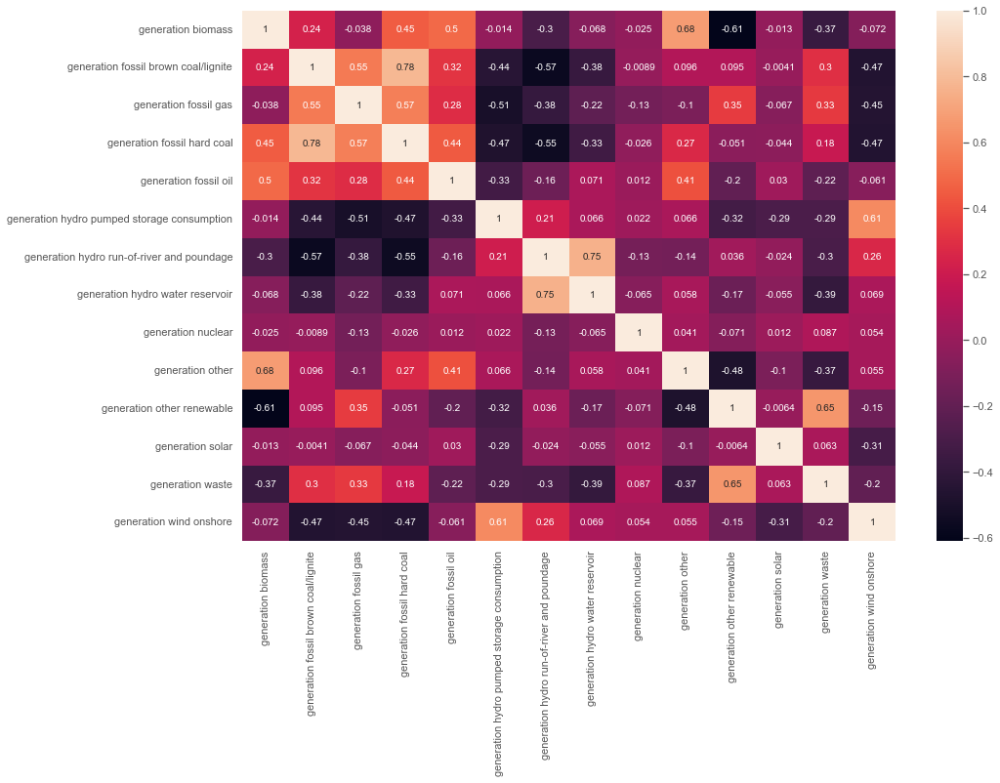

In [153]:
plt.figure(figsize=(15,10))
sns.heatmap(df_spn_day.corr(),annot=True);

<AxesSubplot:>

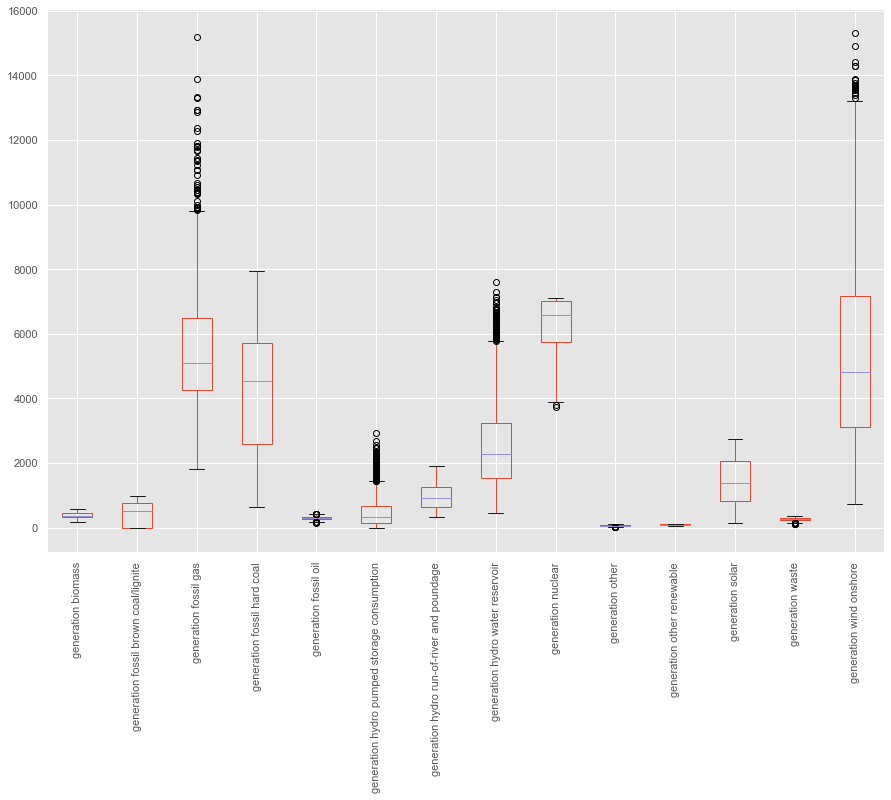

In [154]:
df_spn_day.boxplot(rot='90')

<AxesSubplot:>

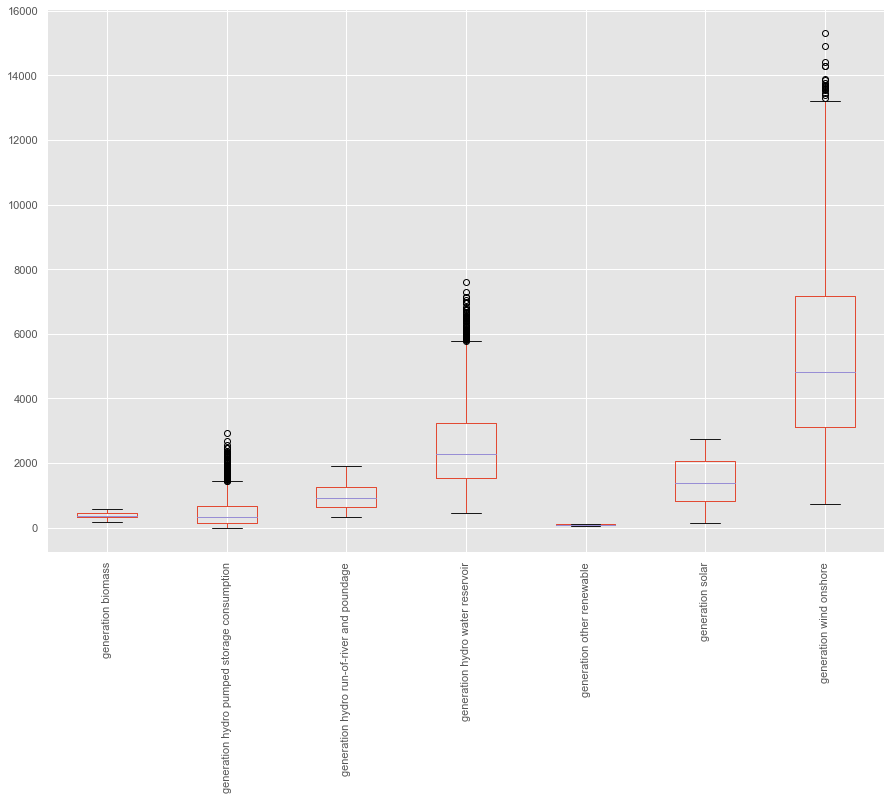

In [155]:
df_spn_day_rnw.boxplot(rot='90')

<AxesSubplot:>

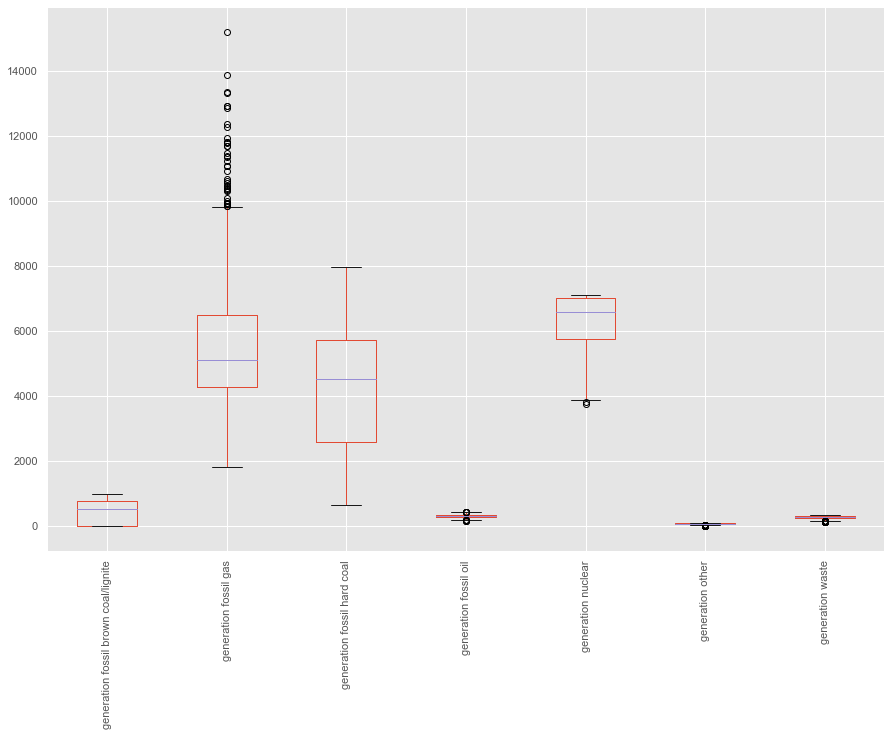

In [156]:
df_spn_day_nrnw.boxplot(rot='90')

In [157]:
df_spn_day_n=df_spn_day_nrnw.join(df_spn_day_rnw)

In [158]:
df_spn_day_n.head()

,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation nuclear,generation other,generation waste,generation biomass,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation other renewable,generation solar,generation wind onshore
day,,,,,,,,,,,,,,
2015-01-01,257.416667,4256.750000,4246.541667,160.208333,7097.000000,42.250000,202.166667,428.500000,1070.416667,1047.875000,2166.875000,73.958333,1143.458333,3708.416667
2015-01-02,0.000000,3540.666667,1237.000000,198.625000,7105.833333,44.250000,185.250000,385.291667,1543.666667,1293.541667,3714.958333,61.375000,1252.208333,11225.375000
2015-01-03,0.000000,3444.291667,1344.250000,226.583333,7095.375000,78.041667,203.958333,440.500000,1338.458333,1374.750000,3969.416667,66.583333,1119.625000,9167.416667
2015-01-04,0.000000,3469.583333,2244.958333,355.416667,7083.625000,83.708333,159.291667,397.125000,590.000000,1495.250000,3241.333333,57.458333,2402.500000,8065.666667
2015-01-05,17.916667,4435.291667,2583.000000,324.625000,3910.375000,39.166667,152.583333,364.500000,1156.833333,1171.916667,2441.666667,73.666667,1631.541667,7801.833333


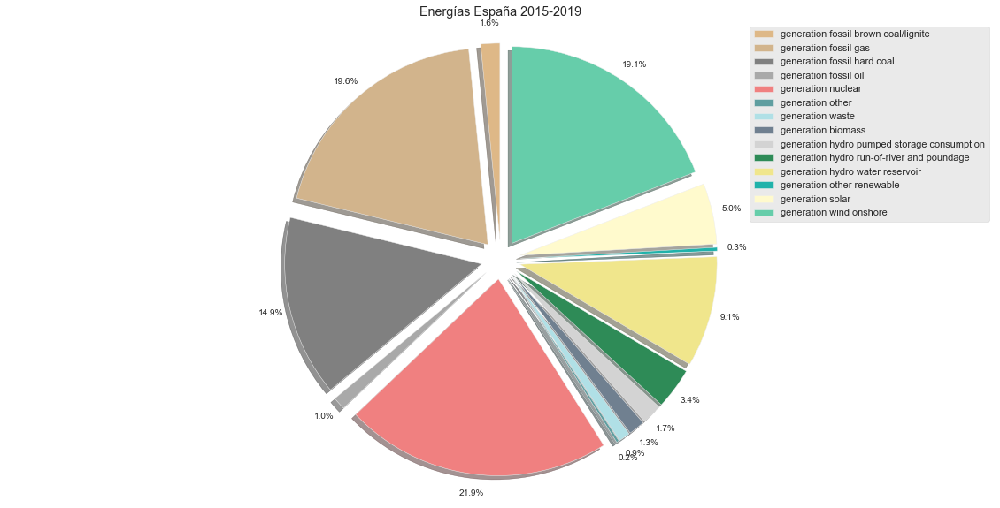

In [169]:
# Pie chart
from tkinter import *
x1=df_spn_day_n.loc[:,df_spn_day_n.columns.str.startswith('generation')].sum()
labels = df_spn_day_n.columns
sizes = (x1/x1.sum())*100
explode = (0.1, 0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1)  
colors=['burlywood',
'tan',
'gray',
'darkgray',
'lightcoral',
'cadetblue',
'powderblue',
'slategray',
'lightgray',
'seagreen',
'khaki',
'lightseagreen',
'lemonchiffon',
'mediumaquamarine']

fig1, ax1 = plt.subplots(figsize=(20,10))
ax1.pie(sizes, explode=explode, autopct='%1.1f%%',
        shadow=True, startangle=90,colors=colors,pctdistance=1.1)
ax1.axis('equal')  
ax1.legend(loc='best',labels=labels)
plt.title('Energías España 2015-2019')

plt.show()

In [177]:
df_spn_month

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore
day_dt,,,,,,,,,,,,,,
1,408.484207,513.729839,5555.720094,4729.612567,302.288978,665.337366,979.137097,2770.372312,6589.449933,62.622648,86.218414,1078.592742,270.983871,6318.325605
2,403.334071,377.205752,5033.216077,3892.417035,300.916298,607.632743,1147.108776,3324.480826,6499.221976,67.540560,84.073009,1226.817847,256.355088,6614.693215
3,372.376851,219.431023,4806.194818,3086.184388,301.005047,632.780956,1247.923620,3427.511104,6558.859690,64.697174,83.340511,1358.448856,248.412517,6756.739906
4,323.329514,290.504861,4783.070486,3235.605903,279.473958,546.873611,1229.948958,3352.738889,6239.123264,45.477431,85.276042,1455.033333,261.030903,5467.831597
5,378.146505,340.439516,5048.454637,3587.334005,295.713374,449.497984,1163.926747,2987.685148,5536.066868,55.401882,86.796035,1734.101478,244.220430,5372.109879
6,379.512847,413.498611,5732.875000,4309.012153,298.390278,353.901736,1041.378125,2581.858333,5993.238889,62.035764,85.550000,1928.446528,274.027778,5094.440278
7,399.819892,560.127352,6310.236895,4833.139113,309.185484,302.954637,862.050739,2262.118952,6337.735215,55.574597,84.268145,1980.201949,286.639113,4634.791667
8,403.199261,465.532594,5652.690524,4484.917675,299.197245,346.663978,784.179772,1994.950941,6600.590726,61.689516,83.867272,1758.973118,284.465390,4666.615255
9,393.483681,555.648958,5663.661458,4630.842708,307.953819,313.620139,738.351736,2100.692361,6547.904514,62.215625,86.706250,1595.380903,283.299306,4489.590972


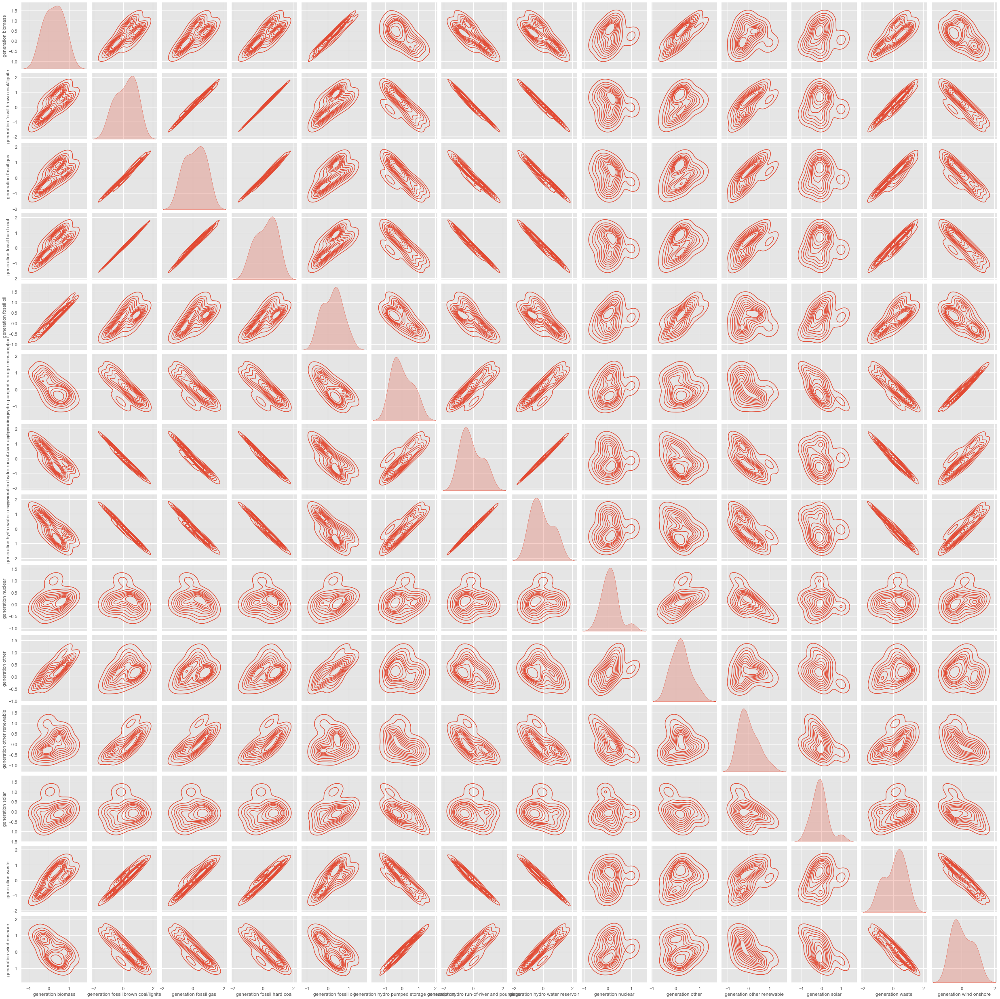

In [160]:
sns.pairplot(df_spn_month.corr(),kind='kde');

In [174]:
len(df_spn_day)

1461

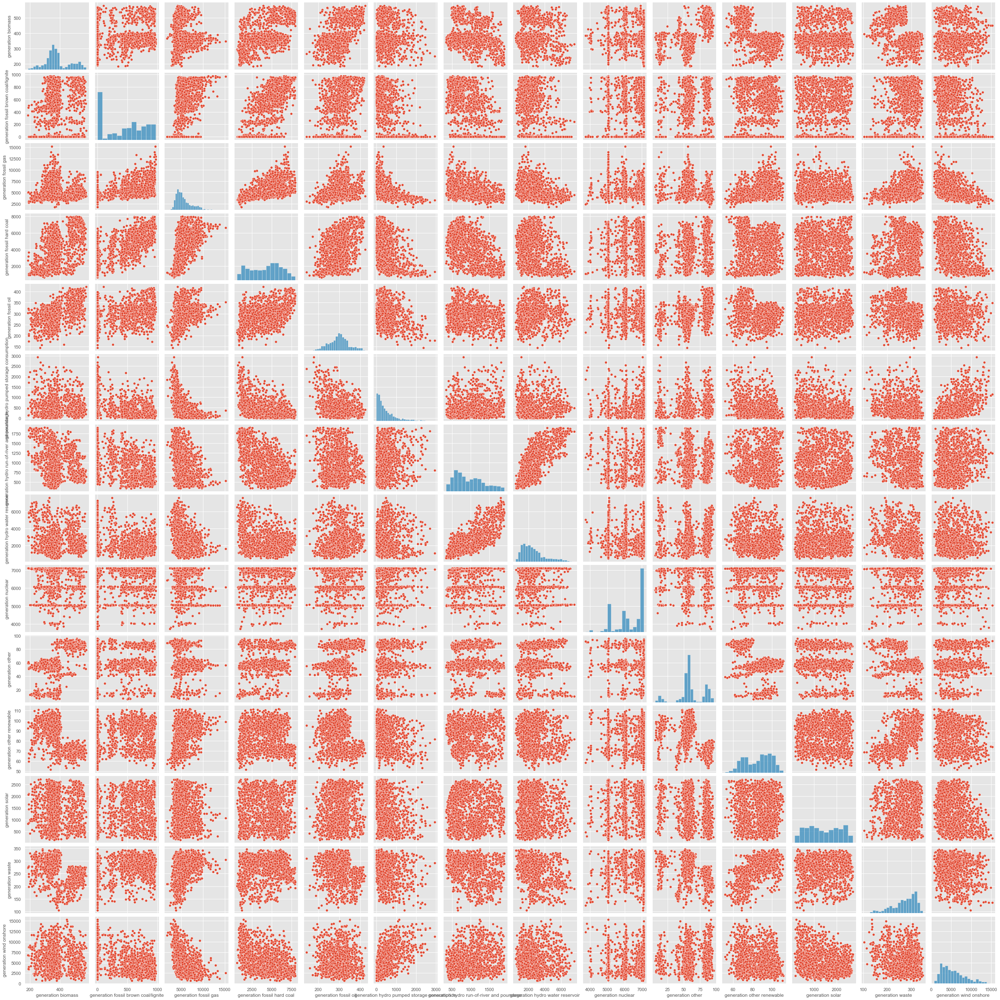

In [178]:
sns.pairplot(df_spn_day);

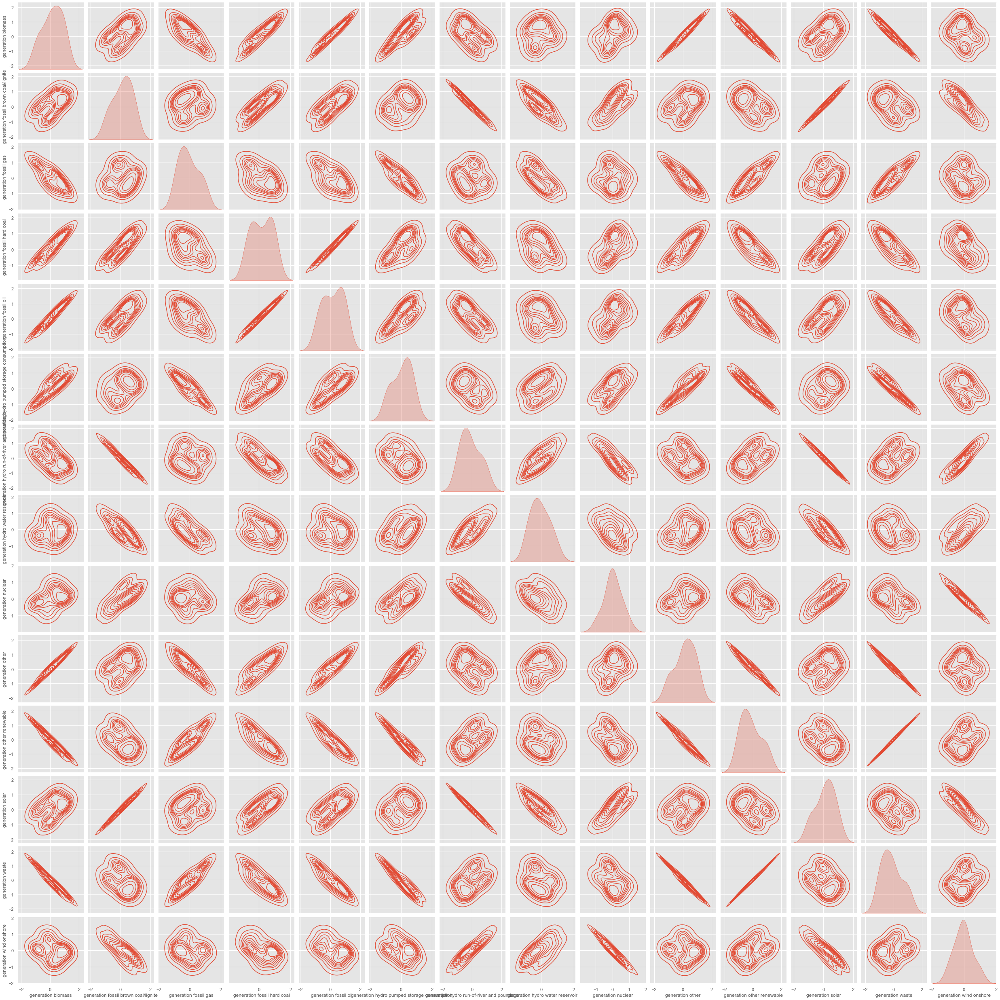

In [179]:
sns.pairplot(df_spn_year.corr(),kind='kde');

<AxesSubplot:xlabel='month_dt'>

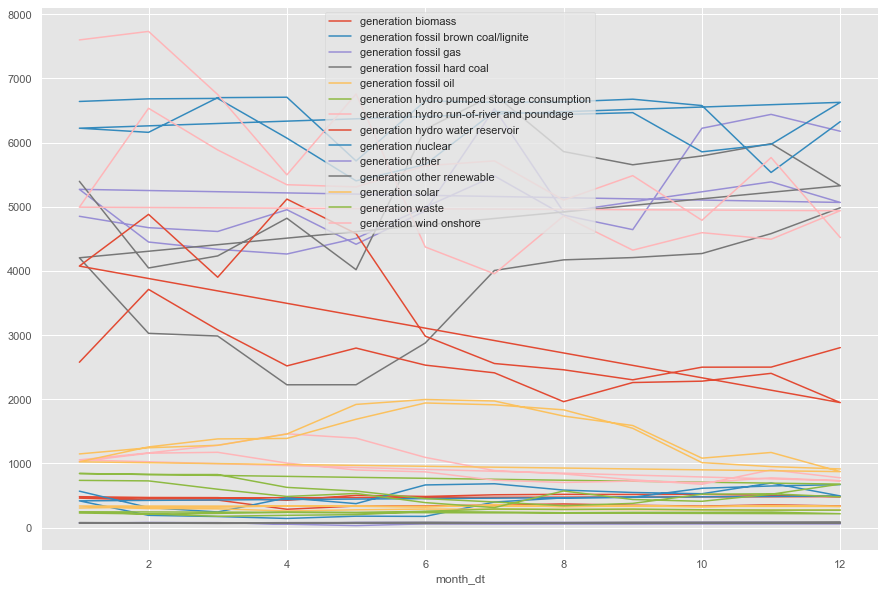

In [215]:
pd.concat([df_spn_month_2015,df_spn_month_2016]).plot()

<bound method Axes.hist of <AxesSubplot:xlabel='day'>>

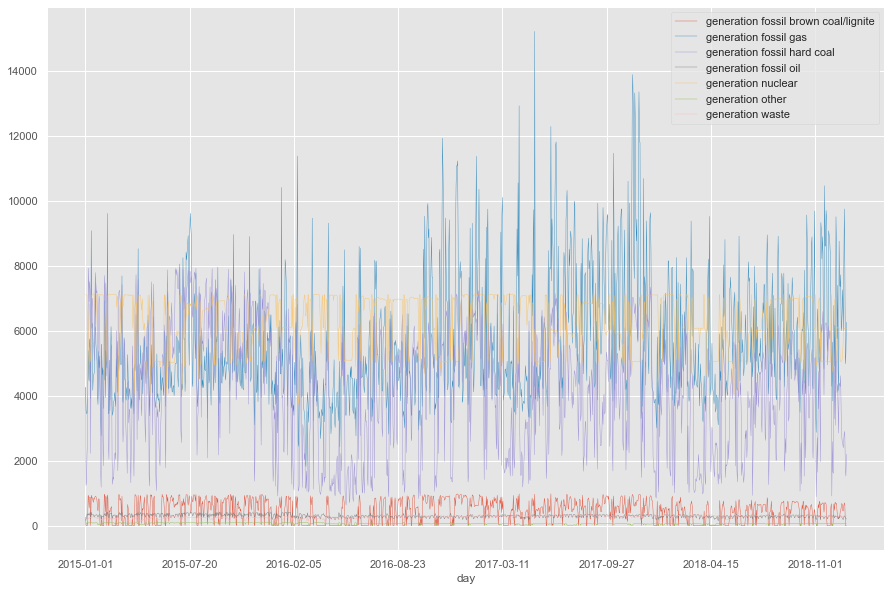

In [190]:
df_spn_day[nrnw].plot(linewidth=0.4).hist

In [233]:
flights = sns.load_dataset("flights")
flights.head(

)

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121


In [234]:
data=df_spn.copy()
data['month']=data['time_dt'].pd.month
data['year']=data['time_dt'].dt.year

AttributeError: 'Series' object has no attribute 'pd'

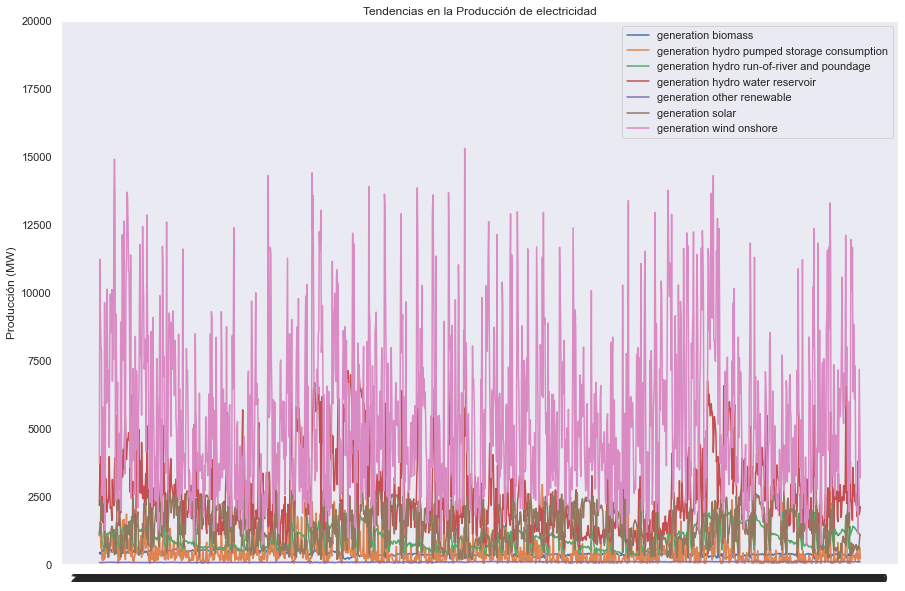

In [239]:
fig,eje= plt.subplots()
for i in rnw:
    eje.plot(df_spn_day[i],label=i)
    eje.set_ylim(0,20000)
    eje.legend()
    eje.set_ylabel('Producción (MW)')
    eje.set_title('Tendencias en la Producción de electricidad')

In [240]:
nrnw

['generation fossil brown coal/lignite',
 'generation fossil gas',
 'generation fossil hard coal',
 'generation fossil oil',
 'generation nuclear',
 'generation other',
 'generation waste']

Text(0.5, 1.0, 'Tendencias en el Generacion Electrico')

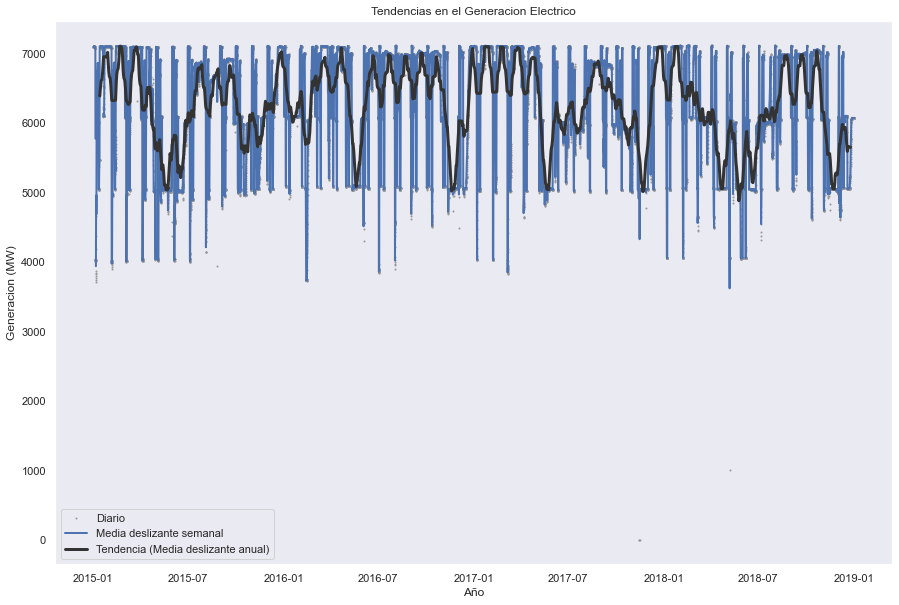

In [241]:
opsd_dia = pd.read_csv(preroot+'/data/spn_energy_data.csv', index_col=0, parse_dates=True)
opsd_365d = opsd_dia[nrnw].rolling(window=365,center=True,min_periods=360).mean()
opsd_7d = opsd_dia[nrnw].rolling(7, center=True).mean()
# 1er Gráfico
fig, eje = plt.subplots()
eje.plot(opsd_dia['generation nuclear'], marker='.', markersize=2, color='0.6',
linestyle='None', label='Diario')
eje.plot(opsd_7d['generation nuclear'], linewidth=2, label='Media deslizante semanal')
eje.plot(opsd_365d['generation nuclear'], color='0.2', linewidth=3,
label='Tendencia (Media deslizante anual)')
eje.legend()
eje.set_xlabel('Año')
eje.set_ylabel('Generacion (MW)')
eje.set_title('Tendencias en el Generacion Electrico')


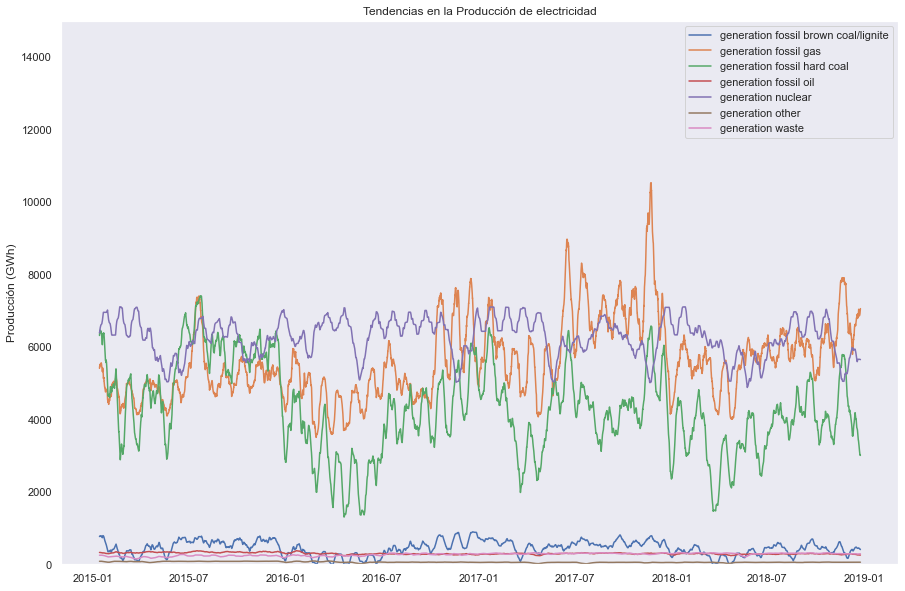

In [243]:
# 2do Gráfico
fig,eje= plt.subplots()
for i in nrnw:
    eje.plot(opsd_365d[i],label=i)
    eje.set_ylim(0,15000)
    eje.legend()
    eje.set_ylabel('Producción (GWh)')
    eje.set_title('Tendencias en la Producción de electricidad')

In [235]:

pd.DatetimeIndex(data['time_dt']).month

Int64Index([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
            ...
            12, 12, 12, 12, 12, 12, 12, 12, 12, 12],
           dtype='int64', name='time_dt', length=35064)

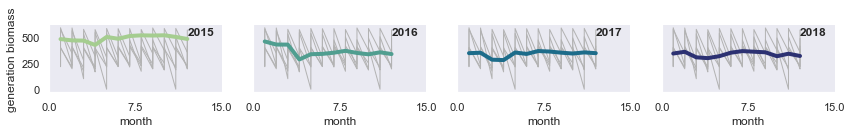

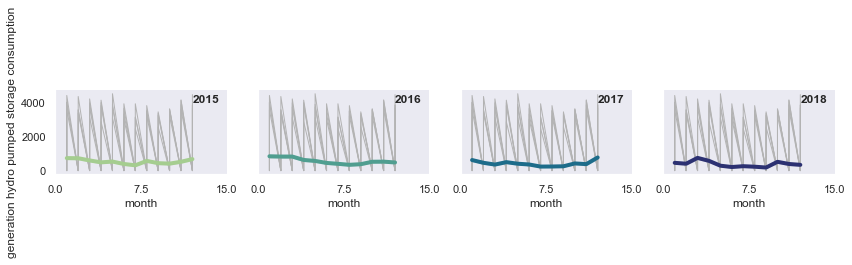

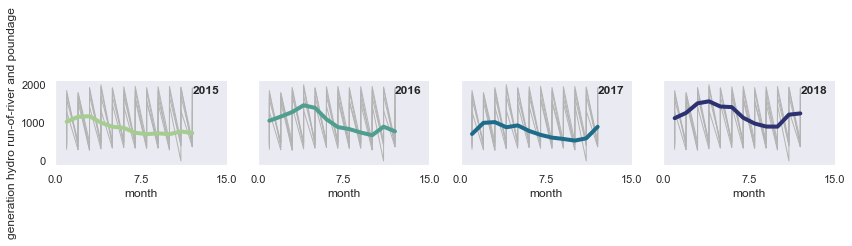

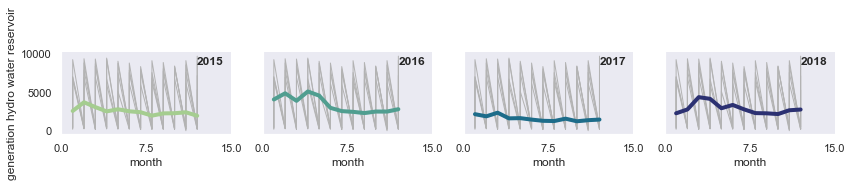

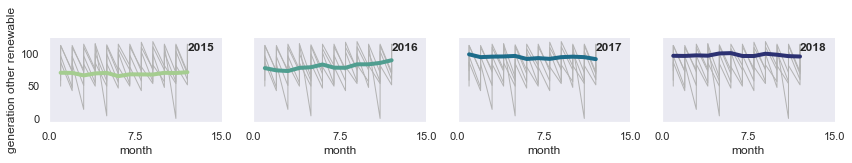

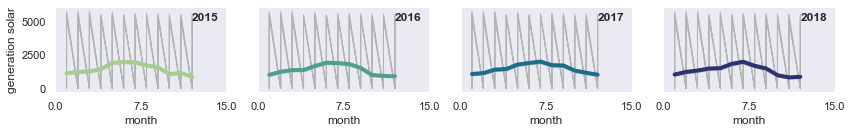

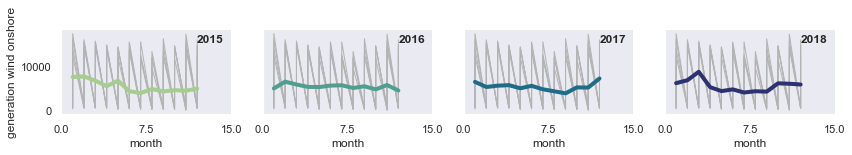

In [228]:
sns.set_theme(style="dark")

# Plot each year's time series in its own facet
for genrnw in rnw:
    g = sns.relplot(
        data=data,
        x="month", y=genrnw, col="year", hue="year",
        kind="line", palette="crest", linewidth=4, zorder=5,
        col_wrap=4, height=2, aspect=1.5, legend=False,
    )

    # Iterate over each subplot to customize further
    for year, ax in g.axes_dict.items():

        # Add the title as an annotation within the plot
        ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")

        # Plot every year's time series in the background
        sns.lineplot(
            data=data, x="month", y=genrnw, units="year",
            estimator=None, color=".7", linewidth=1, ax=ax,
        )

    # Reduce the frequency of the x axis ticks
    ax.set_xticks(ax.get_xticks()[::3])

    # Tweak the supporting aspects of the plot
    g.set_titles("")
    g.set_axis_labels("month", genrnw)
    g.tight_layout()

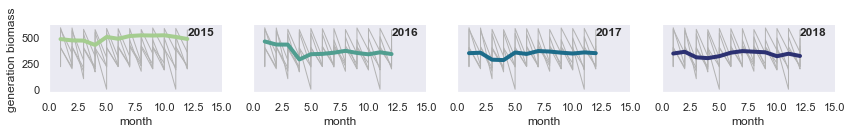

In [230]:
g = sns.relplot(
    data=data,
    x="month", y='generation biomass', col="year", hue="year",
    kind="line", palette="crest", linewidth=4, zorder=5,
    col_wrap=4, height=2, aspect=1.5, legend=False,
)

# Iterate over each subplot to customize further
for year, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")

    # Plot every year's time series in the background
    sns.lineplot(
        data=data, x="month", y='generation biomass', units="year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::1])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("month", 'generation biomass')
g.tight_layout()

In [231]:
data.month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

<AxesSubplot:>

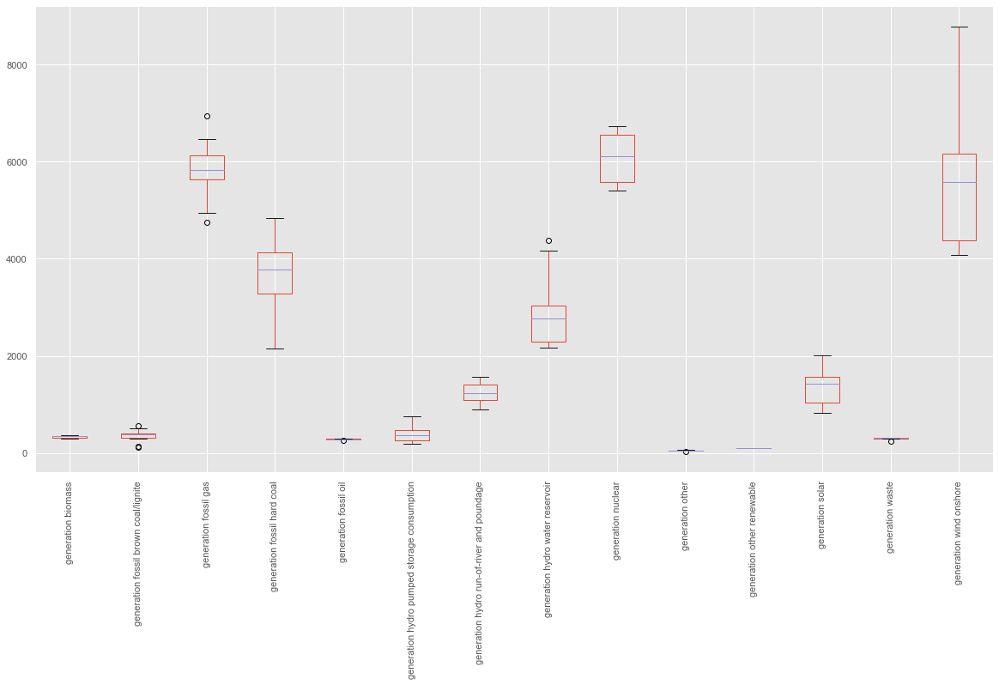

In [162]:
df_spn_month_2018.boxplot(rot='90',figsize=(20,10))

In [163]:
plt.style.use('ggplot')

<AxesSubplot:>

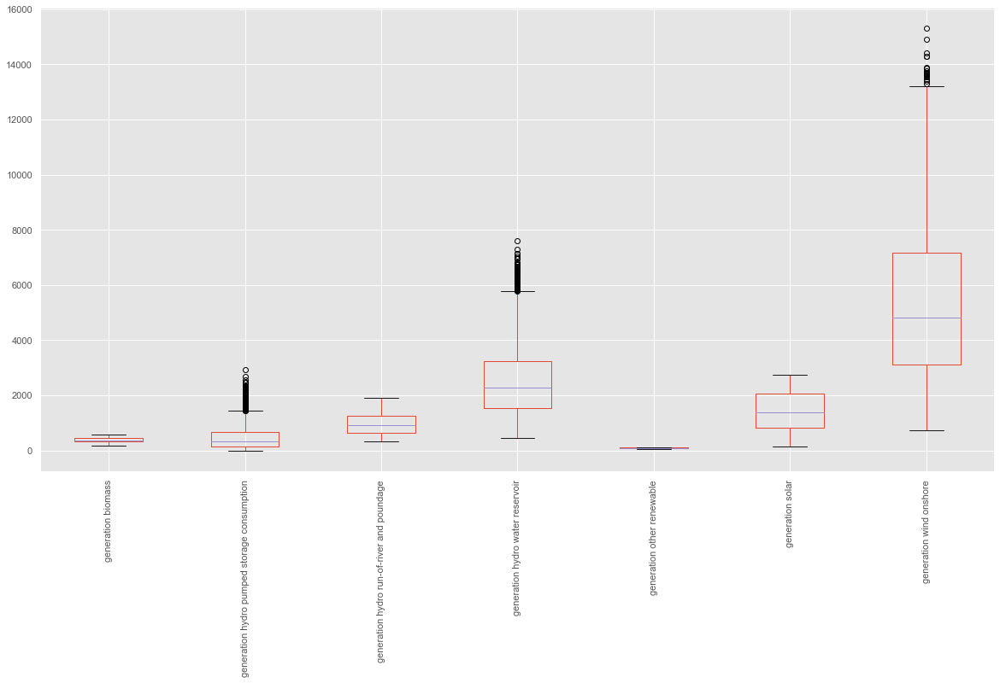

In [164]:
df_spn_day_rnw.boxplot(rot='90',figsize=(20,10))

<AxesSubplot:>

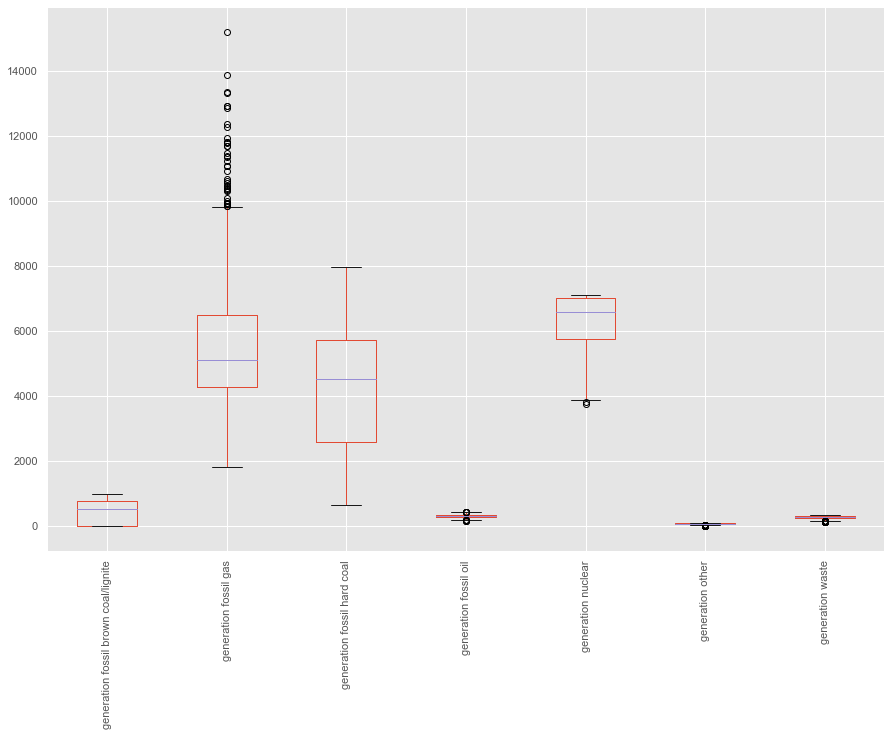

In [165]:
df_spn_day_nrnw.boxplot(rot='90',figsize=(15,10))

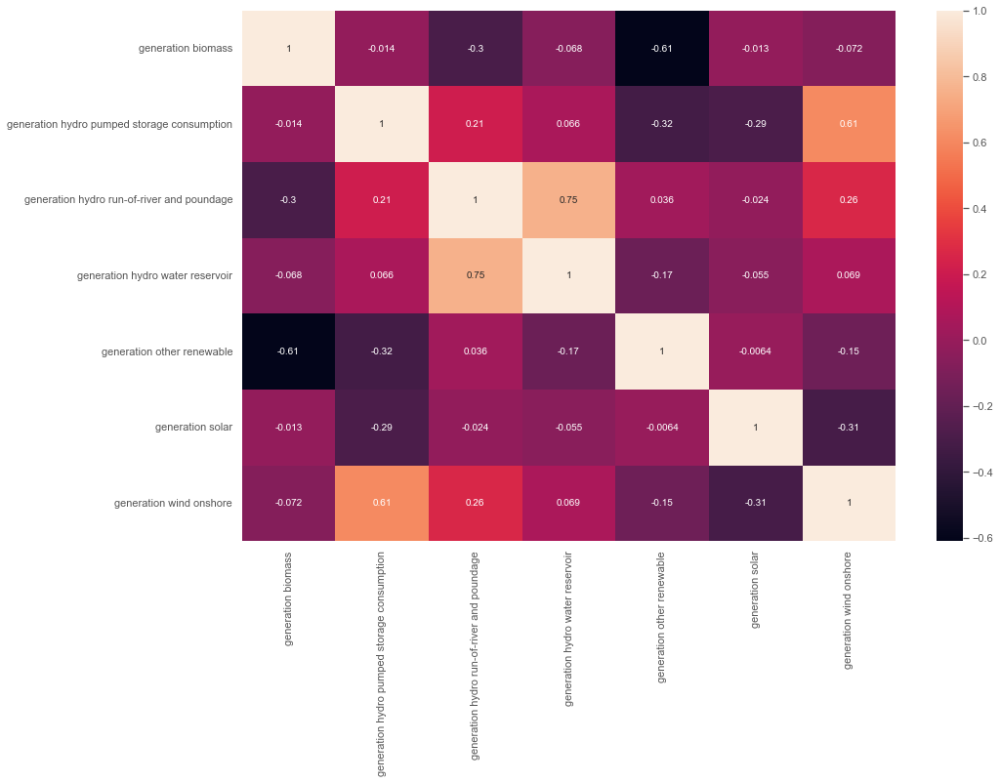

In [166]:
sns.heatmap(df_spn_day_rnw.corr(),annot=True);

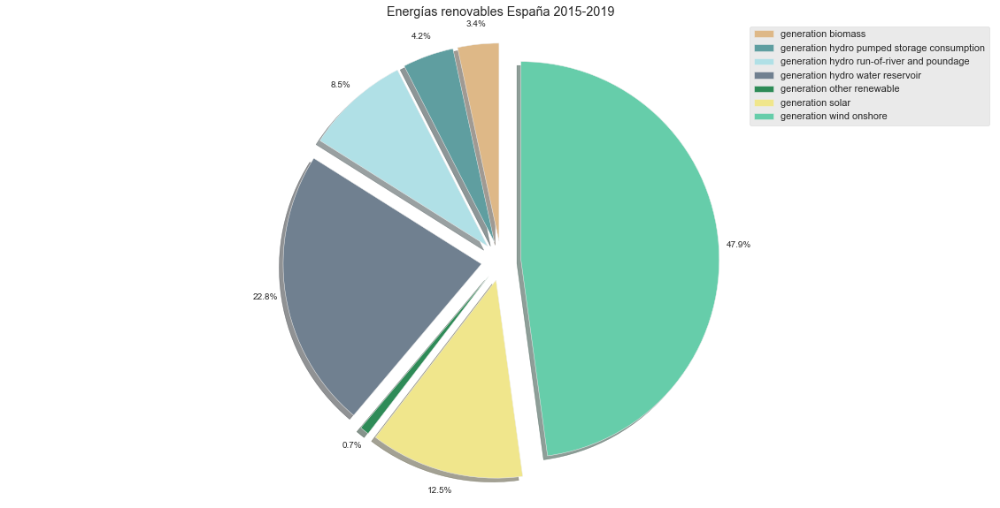

In [210]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
from tkinter import *
x1=df_spn_day_rnw.sum()
labels = df_spn_day_rnw.columns
sizes = (x1/x1.sum())*100
explode = (0.1,)*df_spn_day_rnw.shape[1] # only "explode" the 2nd slice (i.e. 'Hogs')
colorsrwn=['burlywood','cadetblue','powderblue',
'slategray','seagreen',
'khaki','mediumaquamarine']
colorsnrwn=['tan','gray','darkgray','lemonchiffon','lightcoral','lightgray','grey',
'brown']

fig1, ax1 = plt.subplots(figsize=(20,10))
ax1.pie(sizes, explode=explode, colors=colorsrwn,autopct='%1.1f%%',
        shadow=True, startangle=90,pctdistance=1.1)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax1.legend(loc='best',labels=labels)
plt.title('Energías renovables España 2015-2019')

plt.show()

Text(0.5, 1.0, 'Energías no renovables España 2015-2019')

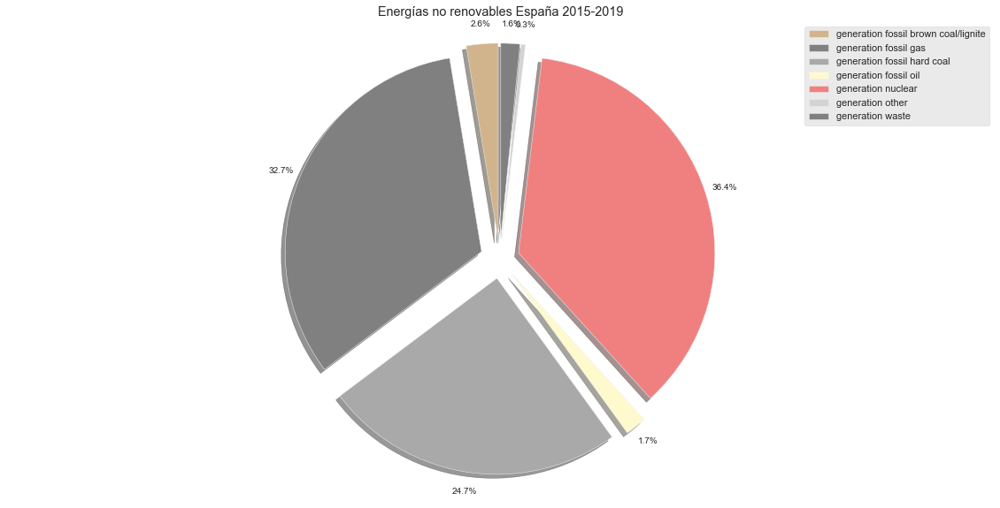

In [211]:
x1=df_spn_day_nrnw.sum()
labels = df_spn_day_nrnw.columns
sizes = (x1/x1.sum())*100
explode = (0.1,)*df_spn_day_nrnw.shape[1] # only "explode" the 2nd slice (i.e. 'Hogs')
fig1, ax1 = plt.subplots(figsize=(20,10))
ax1.pie(sizes, explode=explode,colors=colorsnrwn, autopct='%1.1f%%',
        shadow=True, startangle=90,pctdistance=1.1)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax1.legend(loc='best',labels=labels)
plt.title('Energías no renovables España 2015-2019')

### *1.3.1. Evolución de las energías en España:* <a id='131'></a>

### *1.3.2. Energía generada vs energía demandada:* <a id='132'></a>

### *1.3.3. Balance eficiencia energética-efectos adversos:* <a id='133'></a>

### *1.3.4. Influencia del clima en la generación de energía:* <a id='134'></a>

##  **1.4. Análisis estadístico**<a id='14'></a>

#  **2. Conclusiones**<a id='2'></a>